Importy

In [3]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import joblib
import glob
import itertools
import copy
import os

Wspólne klasy i funkcje sieci

In [2]:
class SubNetwork(nn.Module):
    def __init__(self, input_dim, output_dim=1):
        super(SubNetwork, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 256), nn.ReLU(),
            nn.Linear(256, 256), nn.ReLU(),
            nn.Linear(256, output_dim)
        )
    def forward(self, x): return self.net(x)

def train_greybox_model(model, dataloader, epochs=2000, patience=80, min_delta=1e-6):
    optimizer = optim.Adam(model.parameters(), lr=5e-4)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.95)
    criterion = nn.L1Loss() ##TUTAJ KONIECZNIE PRZETESTUJ MSE!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    
    # --- Zmienne dla Early Stopping ---
    best_loss = float('inf') # Ustawiamy początkowy "najlepszy" błąd na nieskończoność
    patience_counter = 0     # Licznik epok bez poprawy
    best_model_weights = copy.deepcopy(model.state_dict()) # Tu będziemy trzymać kopię najlepszych wag
    
    model.train()
    print(f"Rozpoczynam trening (Maksymalnie {epochs} epok, Cierpliwość: {patience})...")
    
    for epoch in range(epochs):
        epoch_loss = 0.0
        
        # Przejście przez wszystkie paczki danych
        for u_seq, y_true_seq in dataloader:
            x_init = torch.zeros(u_seq.size(0), model.num_states)
            optimizer.zero_grad()
            y_pred_seq = model(u_seq, x_init)
            loss = criterion(y_pred_seq.view_as(y_true_seq), y_true_seq)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
            
        scheduler.step()
        avg_loss = epoch_loss / len(dataloader)
        
        # Wypisywanie postępu
        if (epoch + 1) % 10 == 0:
            print(f"Epoka {epoch+1}/{epochs} | Strata MSE: {avg_loss:.6f}")
            
        # --- LOGIKA EARLY STOPPING ---
        # Sprawdzamy, czy obecna strata jest zauważalnie lepsza od najlepszej dotychczasowej
        if best_loss - avg_loss > min_delta:
            best_loss = avg_loss               # Zapisujemy nowy rekord
            patience_counter = 0               # Zerujemy licznik cierpliwości
            best_model_weights = copy.deepcopy(model.state_dict()) # Kopiujemy i zapisujemy te najlepsze wagi!
        else:
            patience_counter += 1              # Brak poprawy, zwiększamy licznik
            
        # Jeśli straciliśmy cierpliwość (licznik przekroczył limit)
        if patience_counter >= patience:
            print(f"\n[!] EARLY STOPPING: Przerwano trening w epoce {epoch+1}!")
            print(f"Brak poprawy o minimum {min_delta} od {patience} epok.")
            break # Wychodzimy z głównej pętli treningowej
            
    # Po zakończeniu pętli (niezależnie czy doszła do 2000, czy ucięło ją wcześnie)
    # wgrywamy z powrotem NAJLEPSZE wagi, żeby nie zwracać modelu z ostatniej, gorszej epoki.
    model.load_state_dict(best_model_weights)
    print(f"Trening zakończony. Załadowano najlepsze wagi ze stratą MSE: {best_loss:.6f}\n")
    
    return model

def create_sequences(inputs, targets, seq_len=600):
    xs, ys = [], []
    for i in range(0, len(inputs) - seq_len + 1, seq_len):
        xs.append(inputs[i : i + seq_len])
        ys.append(targets[i : i + seq_len])
    return np.array(xs), np.array(ys)


# ULEPSZONA FUNKCJA WALIDACJI Z FILTREM REZIDUUM I "STREFĄ CISZY" (Burn-in)
# ==========================================
def validate_and_plot(model, scaler_u, scaler_y, input_cols, target_cols, file_path, title_prefix, alpha=0.05, threshold=None, burn_in=0):
    # Wczytanie i przygotowanie danych
    df_test = pd.read_csv(file_path)
    X_test_tensor = torch.tensor(scaler_u.transform(df_test[input_cols].values), dtype=torch.float32).unsqueeze(0)
    Y_test_tensor = torch.tensor(scaler_y.transform(df_test[target_cols].values), dtype=torch.float32).unsqueeze(0)
    
    # Przewidywanie modelu
    model.eval()
    with torch.no_grad():
        y_pred = model(X_test_tensor, torch.zeros(1, model.num_states))
        
    y_pred_real = scaler_y.inverse_transform(y_pred[0].cpu().numpy().reshape(-1, 1))
    y_true_real = scaler_y.inverse_transform(Y_test_tensor[0].cpu().numpy().reshape(-1, 1))
    czas = np.arange(len(y_true_real)) * 0.05
    
    # ---------------------------------------------------------
    # OBLICZANIE I FILTROWANIE REZIDUUM (BŁĘDU BEZWZGLĘDNEGO)
    # ---------------------------------------------------------
    e_raw = np.abs(y_true_real - y_pred_real) # Surowy błąd (z Twojego kodu)
    e_filtered = np.zeros_like(e_raw)         # Pusta tablica na przefiltrowany błąd
    e_filtered[0] = e_raw[0]                  # Stan początkowy
    
    # Pętla filtru EMA (Exponential Moving Average - Filtr dolnoprzepustowy I rzędu)
    for i in range(1, len(e_raw)):
        e_filtered[i] = alpha * e_raw[i] + (1 - alpha) * e_filtered[i-1]
        
    # --- NAPRAWA BŁĘDU STANU POCZĄTKOWEGO (Burn-in period) ---
    # Sztuczne wyzerowanie błędu dla pierwszych N próbek (np. 50 próbek = 2.5 sekundy), 
    # żeby model zdążył się numerycznie "napompować" do wartości fizycznych.
    if burn_in > 0:
        e_raw[:burn_in] = 0.0
        e_filtered[:burn_in] = 0.0
    
    # ---------------------------------------------------------
    # RYSOWANIE WYKRESÓW
    # ---------------------------------------------------------
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 8), sharex=True)
    
    # Górny wykres: Fizyka
    ax1.plot(czas, y_true_real, label='Prawda (Czujnik)', color='black', alpha=0.7)
    ax1.plot(czas, y_pred_real, label='Symulacja (AI)', color='red', linestyle='--', alpha=0.9)
    ax1.set_title(f'{title_prefix} | Plik: {file_path.split("/")[-1]}', fontsize=12)
    ax1.set_ylabel('Wartość fizyczna (np. Pa)')
    ax1.legend(loc='upper right')
    ax1.grid(True, linestyle=':', alpha=0.7)
    
    # Dolny wykres: Diagnostyka
    ax2.plot(czas, e_raw, label='Surowe Reziduum (Szum)', color='gray', alpha=0.4)
    ax2.plot(czas, e_filtered, label=f'Przefiltrowane Reziduum (alpha={alpha})', color='darkred', linewidth=2)
    
    # Jeśli podałeś próg alarmowy, narysuj go
    if threshold is not None:
        ax2.axhline(threshold, color='orange', linestyle='--', linewidth=2, label=f'Próg Detekcji ({threshold})')
        
    ax2.set_title('Sygnał Diagnostyczny (Reziduum)', fontsize=12)
    ax2.set_xlabel('Czas [s]')
    ax2.set_ylabel('Błąd predykcji')
    ax2.legend(loc='upper right')
    ax2.grid(True, linestyle=':', alpha=0.7)
    
    plt.tight_layout()
    plt.show()
    
    # Do liczenia statystyk bierzemy dane dopiero PO fazie rozgrzewki, 
    # żeby ten gigantyczny spadek początkowy nie niszczył wyników MAE!
    print(f"Średni błąd bezwzględny (MAE po rozgrzewce): {np.mean(e_raw[burn_in:]):.4f}")
    print(f"Maksymalny błąd przefiltrowany (po rozgrzewce): {np.max(e_filtered[burn_in:]):.4f}")

MSO_10 - Intercooler

In [ ]:
class GreyBoxSystem_MSO10(nn.Module):
    def __init__(self, T_sample=0.05):
        super(GreyBoxSystem_MSO10, self).__init__()
        self.T = T_sample
        self.num_states = 1
        self.num_inputs = 4
        total_feat = self.num_states + self.num_inputs
        self.g_func = SubNetwork(total_feat, 1)
        self.h_func = SubNetwork(total_feat, 1)

    def forward(self, u_seq, x_init):
        x_t, preds = x_init, []
        for t in range(u_seq.size(1)):
            inputs = torch.cat((x_t, u_seq[:, t, :]), dim=1)
            preds.append(self.h_func(inputs))
            x_t = x_t + self.T * self.g_func(inputs)
        return torch.stack(preds, dim=1)

#testowo podmieniłem air mass flow na injected fulel -> więcej danych ale brak zab przez awarią inj fuel
u_cols_10 = ['injected_fuel_mass', 'intercooler_temperature', 'Intercooler_pressure', 'throttle_position']
y_cols_10 = ['intake_manifold_pressure']

DATA_DIR = r"C:\Users\anton\OneDrive\Desktop\data"

HEALTHY_FILES = glob.glob(os.path.join(DATA_DIR, "*_NF*.csv"))
FAULTY_FILES_PIM = glob.glob(os.path.join(DATA_DIR, "*_f_pim*.csv"))
FAULTY_FILES_PIC = glob.glob(os.path.join(DATA_DIR, "*_f_pic*.csv"))
FAULTY_FILES_WAF = glob.glob(os.path.join(DATA_DIR, "*_f_waf*.csv"))
FAULTY_FILES_IML = glob.glob(os.path.join(DATA_DIR, "*_f_iml*.csv"))

healthy_dfs = [pd.read_csv(f) for f in HEALTHY_FILES]
faulty_dfs_iml = [pd.read_csv(f) for f in FAULTY_FILES_IML]
faulty_dfs_waf = [pd.read_csv(f) for f in FAULTY_FILES_WAF]


df_train_nf = pd.concat(healthy_dfs + faulty_dfs_iml + faulty_dfs_waf, ignore_index=True)

scaler_u10, scaler_y10 = MinMaxScaler(), MinMaxScaler()
u10_norm = scaler_u10.fit_transform(df_train_nf[u_cols_10].values)
y10_norm = scaler_y10.fit_transform(df_train_nf[y_cols_10].values)

X_seq10, Y_seq10 = create_sequences(u10_norm, y10_norm)
loader10 = DataLoader(TensorDataset(torch.tensor(X_seq10, dtype=torch.float32), torch.tensor(Y_seq10, dtype=torch.float32)), batch_size=16, shuffle=True)

# --- TRENOWANIE ---
#Odkomentuj poniższe linie, gdy chcesz wytrenować model na nowo
#model10 = GreyBoxSystem_MSO10()
#model10 = train_greybox_model(model10, loader10, epochs=2000)

#torch.save(model10.state_dict(), 'szara_skrzynka_mso10_inj_fuel.pth')
#joblib.dump(scaler_u10, 'scaler_u_mso10_inj_fuel.pkl')
#joblib.dump(scaler_y10, 'scaler_y_mso10_inj_fuel.pkl')

print("Komórka MSO 10 gotowa!")

Rozpoczynam trening (Maksymalnie 2000 epok, Cierpliwość: 80)...
Epoka 10/2000 | Strata MSE: 0.021579
Epoka 20/2000 | Strata MSE: 0.019759
Epoka 30/2000 | Strata MSE: 0.017940
Epoka 40/2000 | Strata MSE: 0.017826
Epoka 50/2000 | Strata MSE: 0.016817
Epoka 60/2000 | Strata MSE: 0.016733
Epoka 70/2000 | Strata MSE: 0.015965
Epoka 80/2000 | Strata MSE: 0.015944
Epoka 90/2000 | Strata MSE: 0.016025
Epoka 100/2000 | Strata MSE: 0.016015
Epoka 110/2000 | Strata MSE: 0.015008
Epoka 120/2000 | Strata MSE: 0.014769
Epoka 130/2000 | Strata MSE: 0.014510
Epoka 140/2000 | Strata MSE: 0.014308
Epoka 150/2000 | Strata MSE: 0.014467
Epoka 160/2000 | Strata MSE: 0.014272
Epoka 170/2000 | Strata MSE: 0.014464
Epoka 180/2000 | Strata MSE: 0.013927
Epoka 190/2000 | Strata MSE: 0.013900
Epoka 200/2000 | Strata MSE: 0.013811
Epoka 210/2000 | Strata MSE: 0.014872
Epoka 220/2000 | Strata MSE: 0.013831
Epoka 230/2000 | Strata MSE: 0.013557
Epoka 240/2000 | Strata MSE: 0.013816
Epoka 250/2000 | Strata MSE: 0.01

Model MSO 10 (2 stany) i skalery zostały pomyślnie wczytane z dysku!


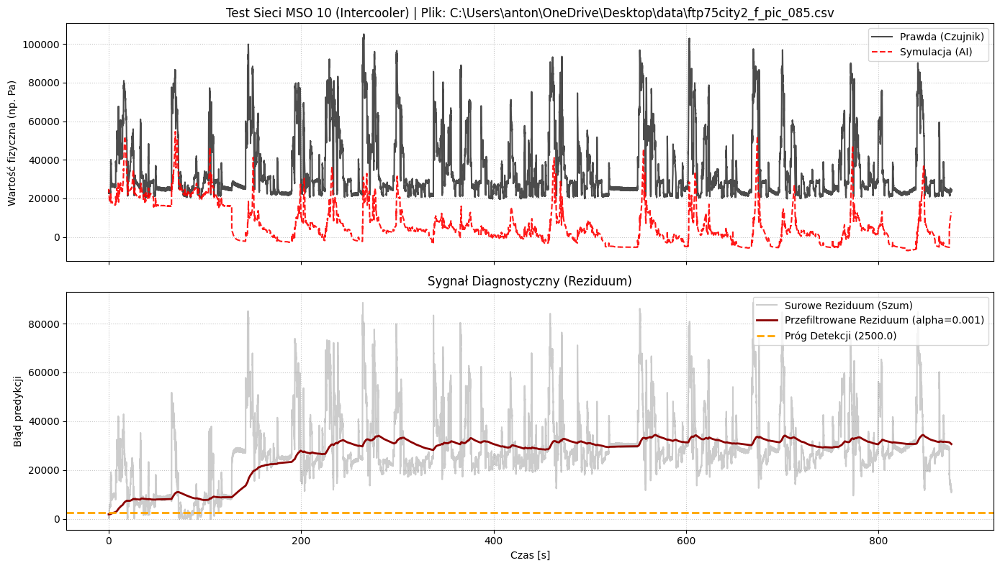

Średni błąd bezwzględny (MAE po rozgrzewce): 28429.8906
Maksymalny błąd przefiltrowany (po rozgrzewce): 34422.6953


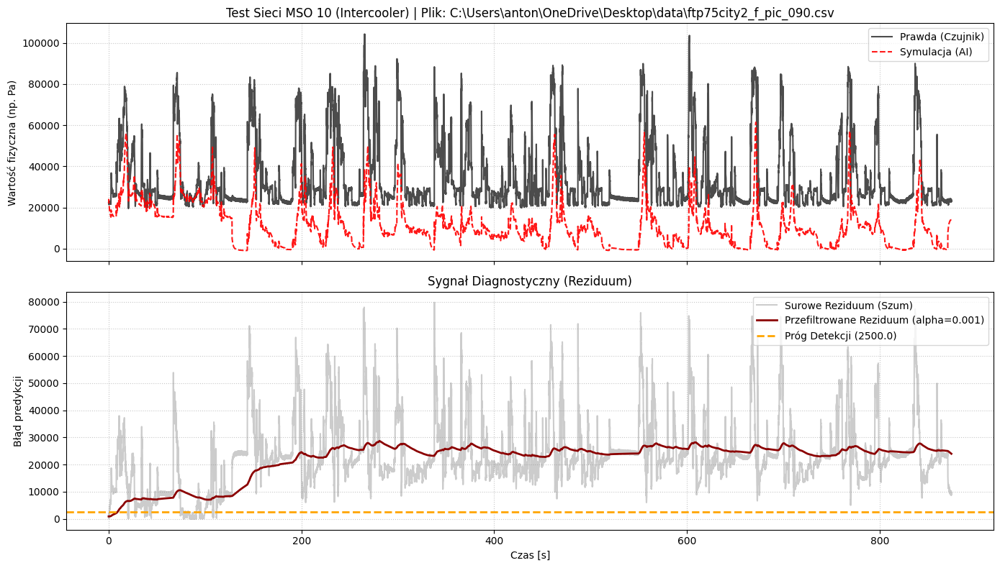

Średni błąd bezwzględny (MAE po rozgrzewce): 23338.7715
Maksymalny błąd przefiltrowany (po rozgrzewce): 28706.0059


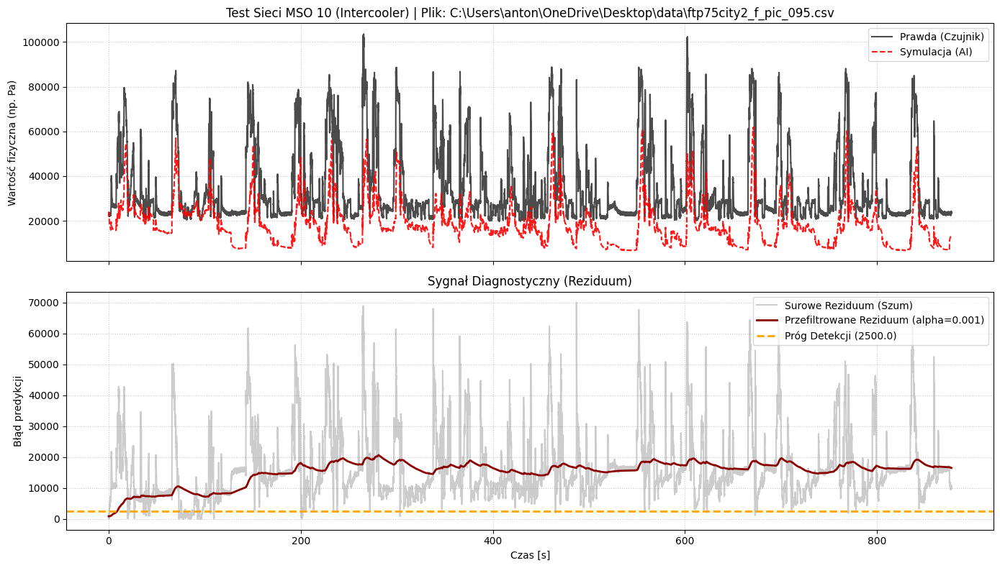

Średni błąd bezwzględny (MAE po rozgrzewce): 16139.7021
Maksymalny błąd przefiltrowany (po rozgrzewce): 20638.9199


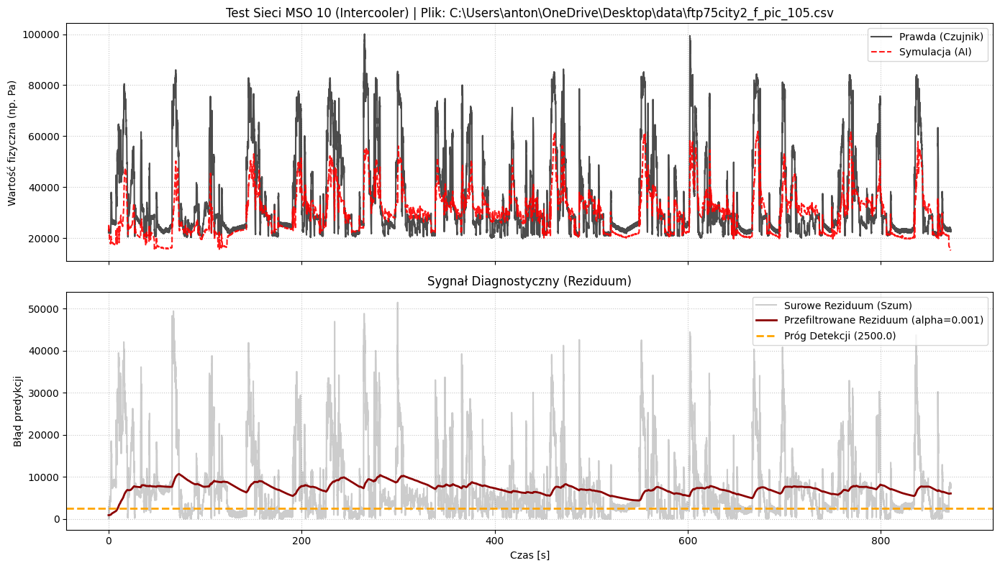

Średni błąd bezwzględny (MAE po rozgrzewce): 7524.5835
Maksymalny błąd przefiltrowany (po rozgrzewce): 10700.7627


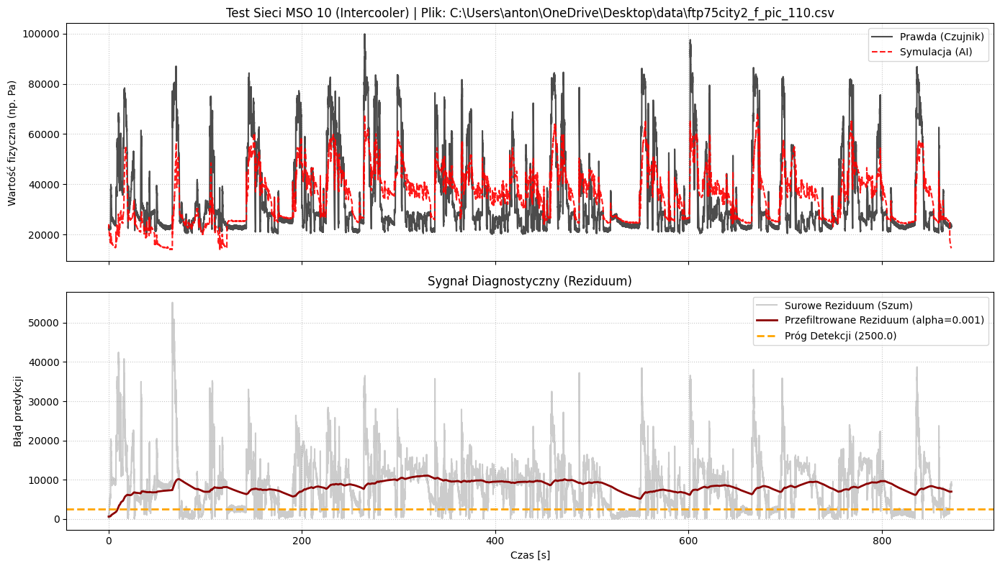

Średni błąd bezwzględny (MAE po rozgrzewce): 8507.6133
Maksymalny błąd przefiltrowany (po rozgrzewce): 11047.3037


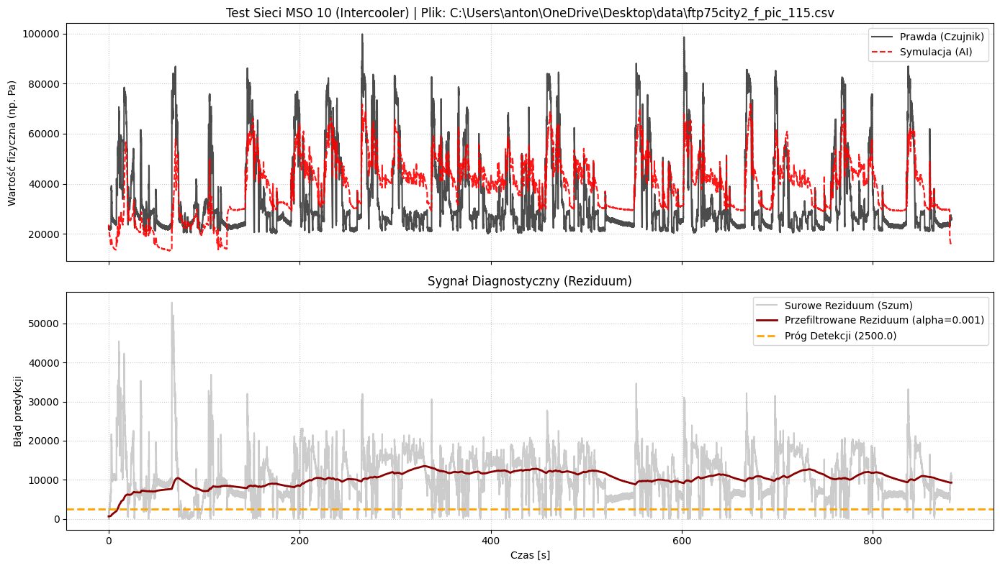

Średni błąd bezwzględny (MAE po rozgrzewce): 10739.4424
Maksymalny błąd przefiltrowany (po rozgrzewce): 13505.3066


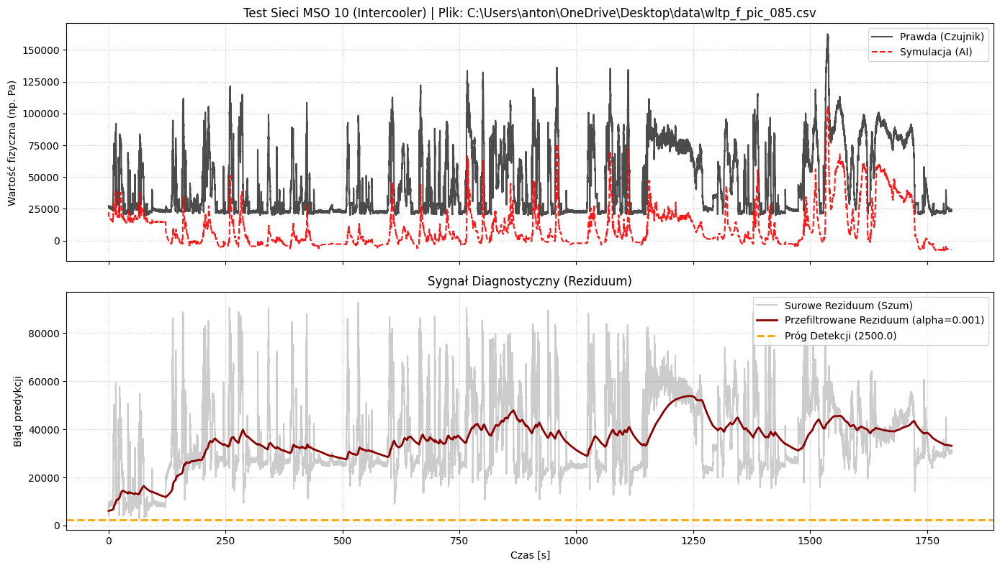

Średni błąd bezwzględny (MAE po rozgrzewce): 36027.7383
Maksymalny błąd przefiltrowany (po rozgrzewce): 53934.5820


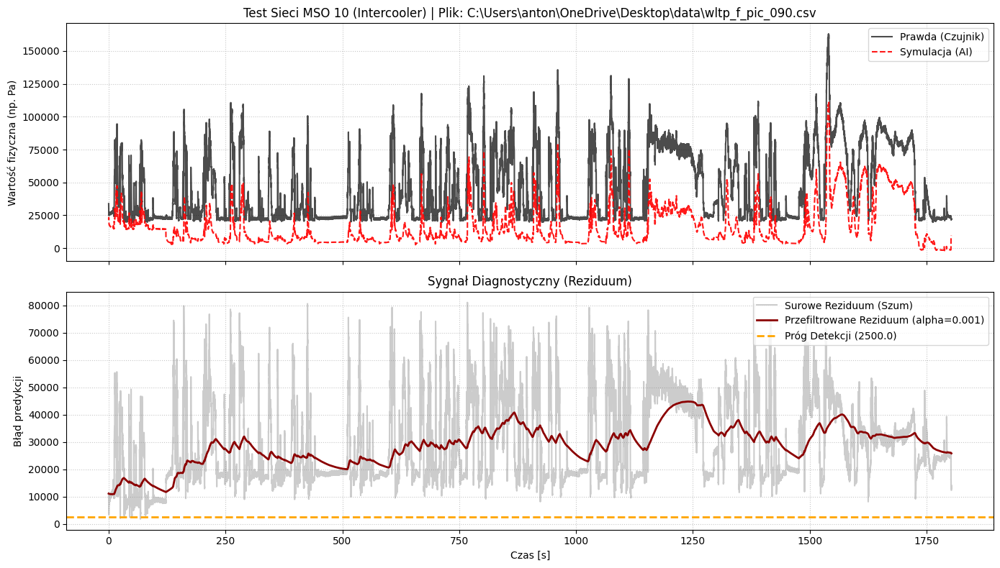

Średni błąd bezwzględny (MAE po rozgrzewce): 29266.5117
Maksymalny błąd przefiltrowany (po rozgrzewce): 44830.3008


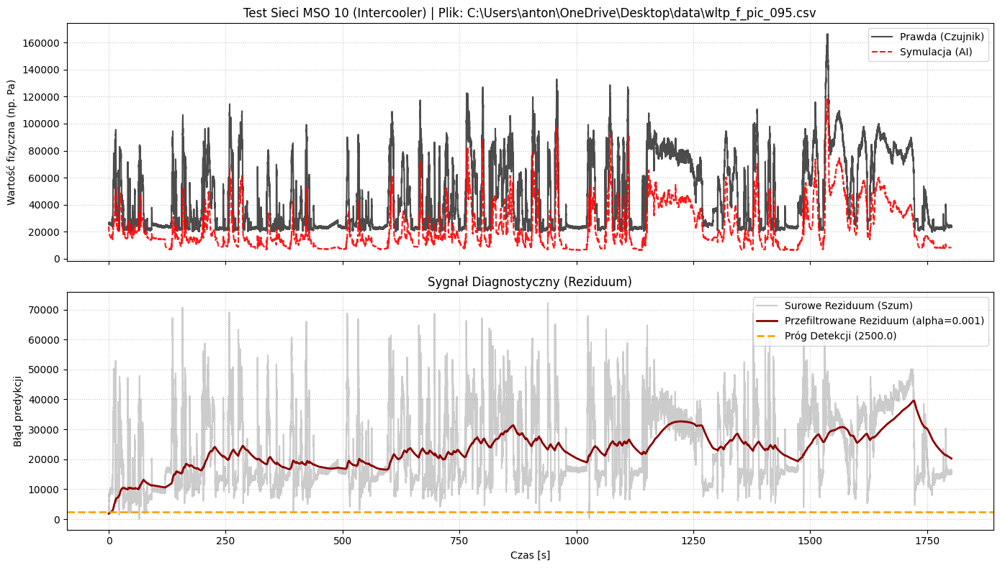

Średni błąd bezwzględny (MAE po rozgrzewce): 23374.3906
Maksymalny błąd przefiltrowany (po rozgrzewce): 39612.7031


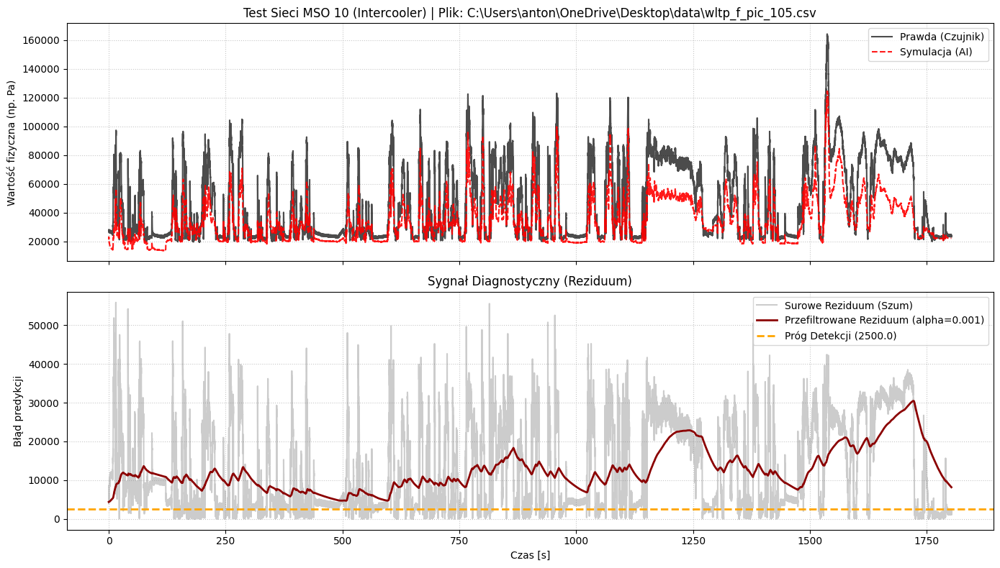

Średni błąd bezwzględny (MAE po rozgrzewce): 12618.8662
Maksymalny błąd przefiltrowany (po rozgrzewce): 30481.9492


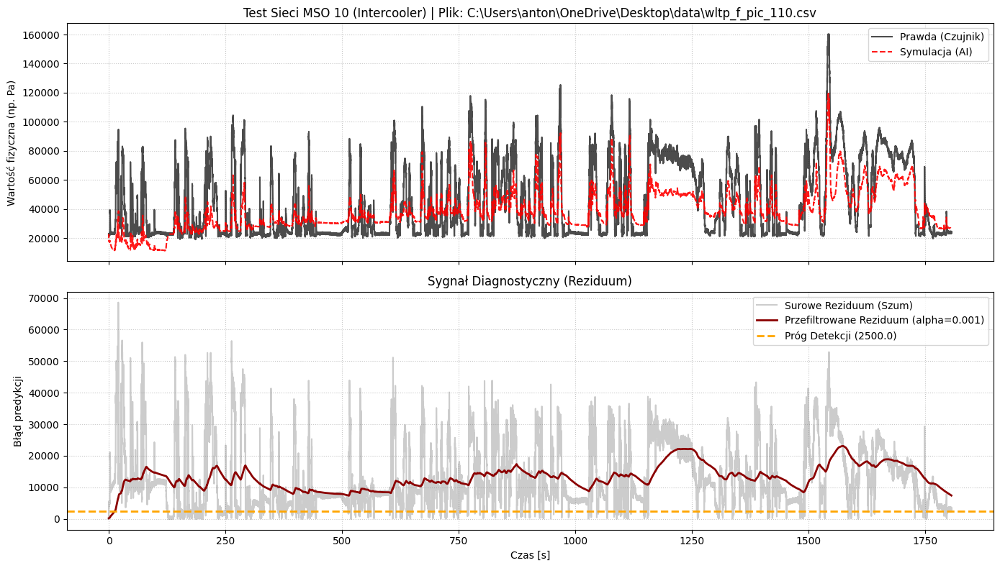

Średni błąd bezwzględny (MAE po rozgrzewce): 13343.3770
Maksymalny błąd przefiltrowany (po rozgrzewce): 23120.8281


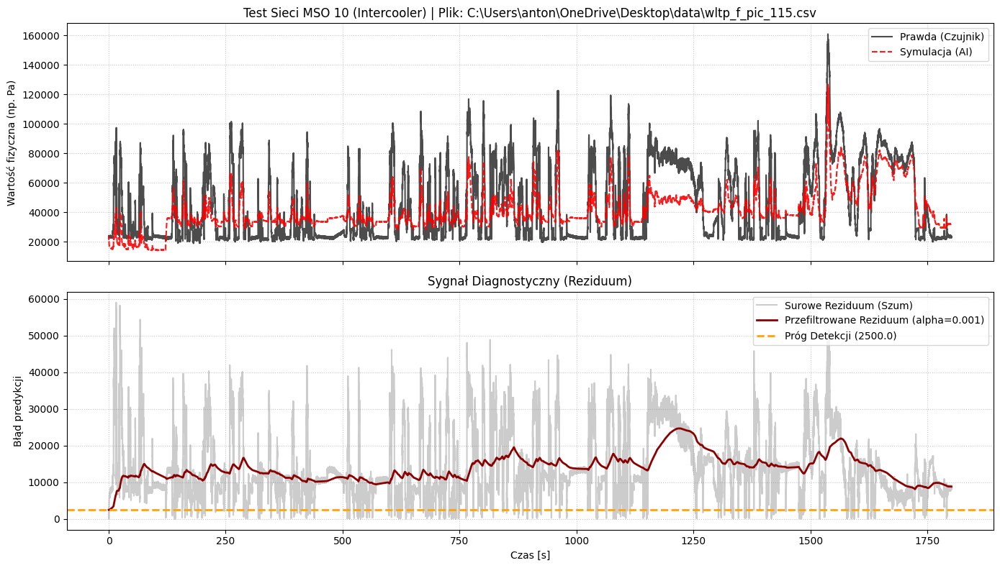

Średni błąd bezwzględny (MAE po rozgrzewce): 14025.2344
Maksymalny błąd przefiltrowany (po rozgrzewce): 24712.1367


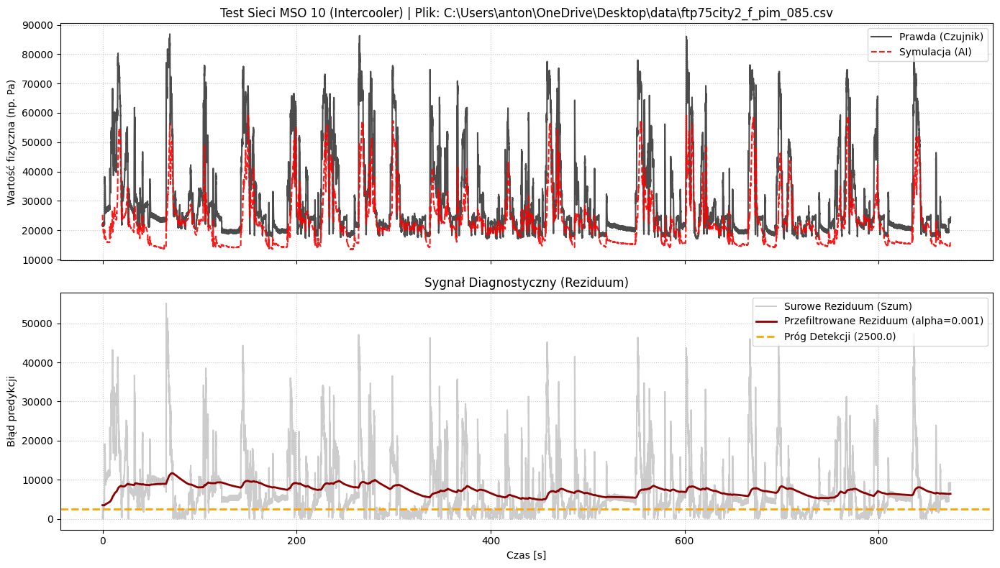

Średni błąd bezwzględny (MAE po rozgrzewce): 7523.2964
Maksymalny błąd przefiltrowany (po rozgrzewce): 11685.4502


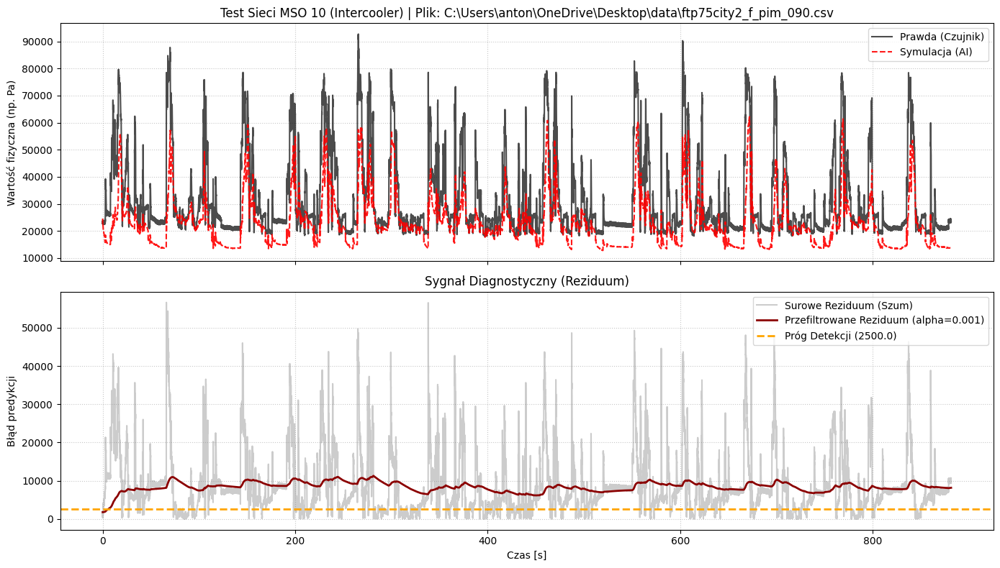

Średni błąd bezwzględny (MAE po rozgrzewce): 8724.5186
Maksymalny błąd przefiltrowany (po rozgrzewce): 11263.9629


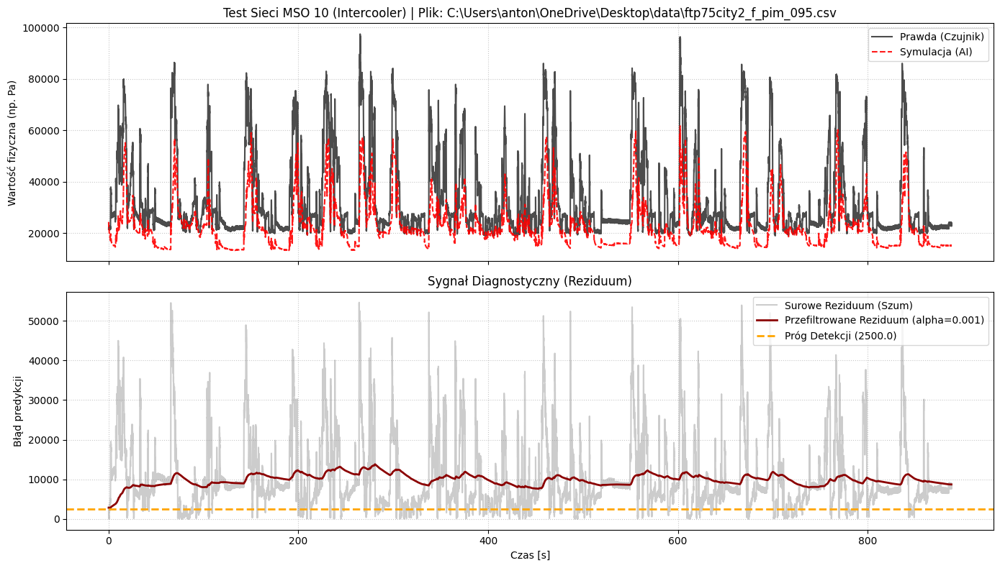

Średni błąd bezwzględny (MAE po rozgrzewce): 10205.7246
Maksymalny błąd przefiltrowany (po rozgrzewce): 13786.2109


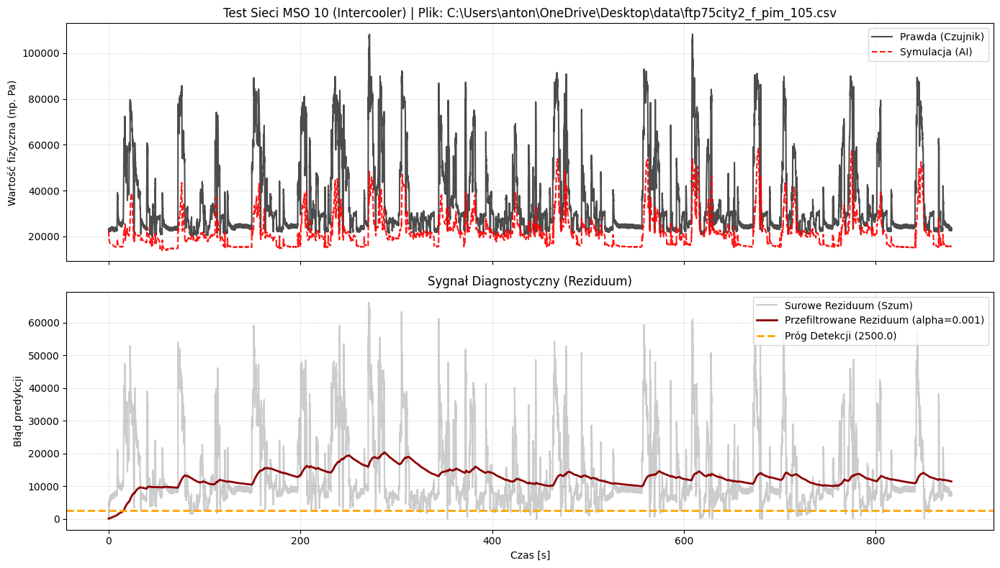

Średni błąd bezwzględny (MAE po rozgrzewce): 13332.9893
Maksymalny błąd przefiltrowany (po rozgrzewce): 20372.2285


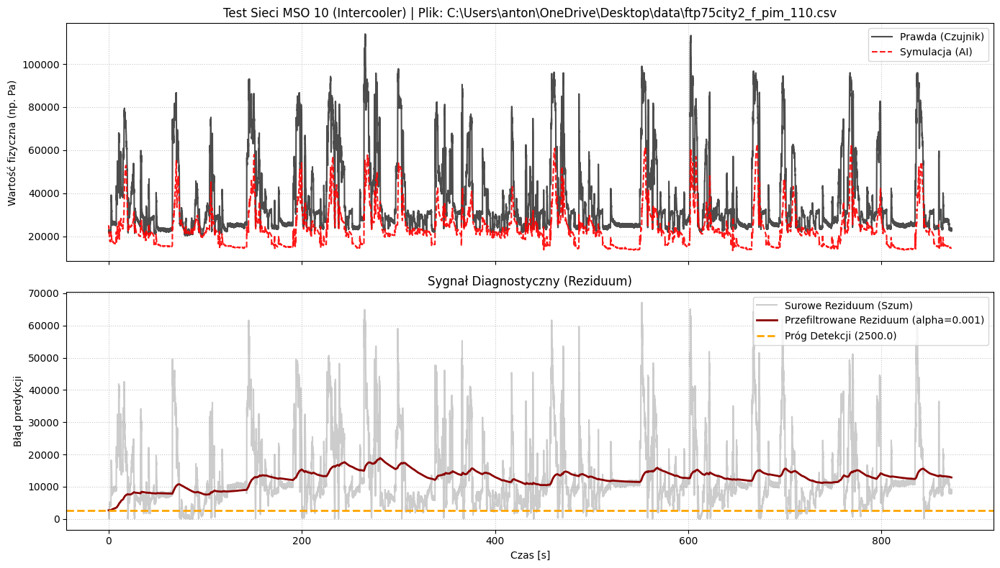

Średni błąd bezwzględny (MAE po rozgrzewce): 13220.8818
Maksymalny błąd przefiltrowany (po rozgrzewce): 18879.8438


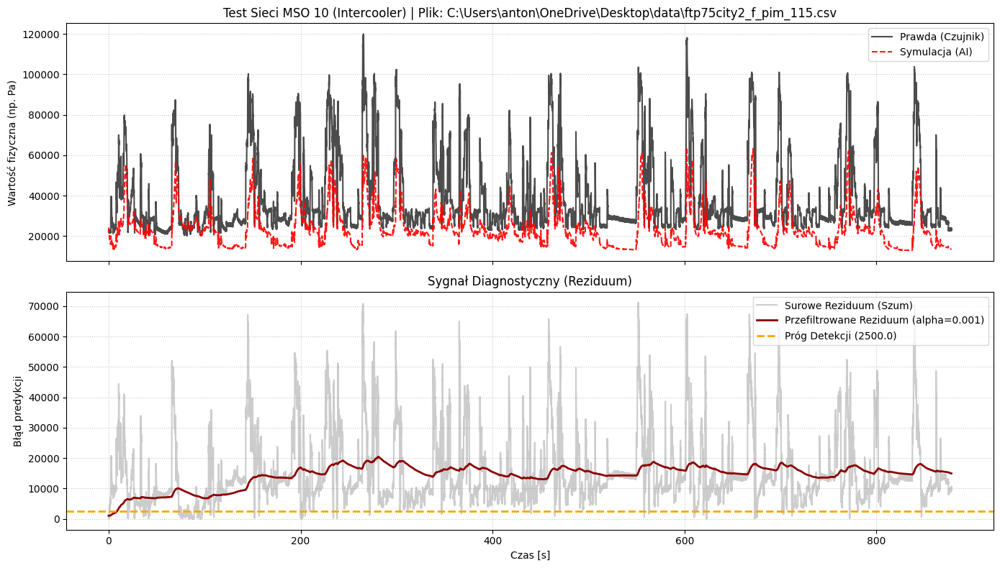

Średni błąd bezwzględny (MAE po rozgrzewce): 15239.7969
Maksymalny błąd przefiltrowany (po rozgrzewce): 20470.2715


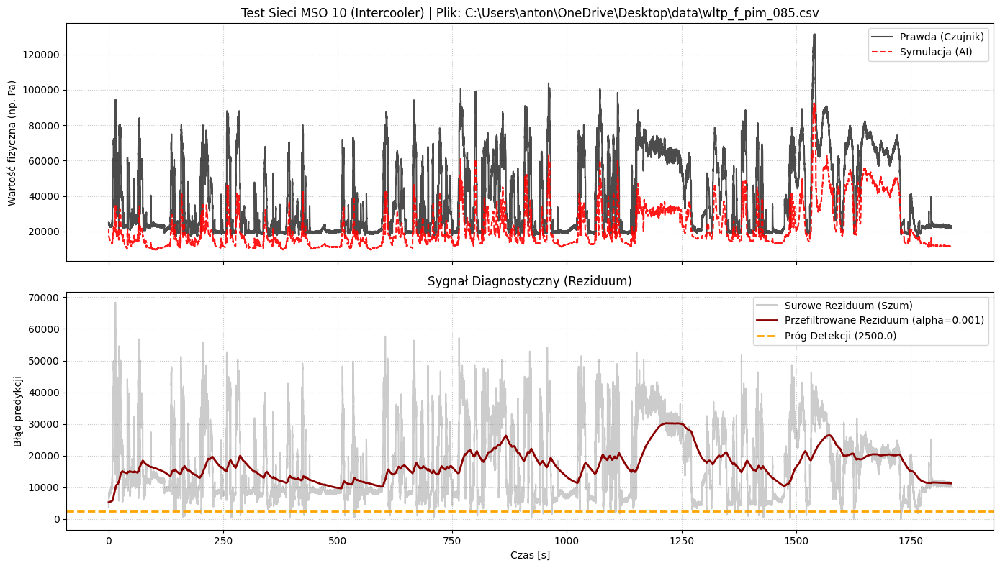

Średni błąd bezwzględny (MAE po rozgrzewce): 17152.6426
Maksymalny błąd przefiltrowany (po rozgrzewce): 30221.8906


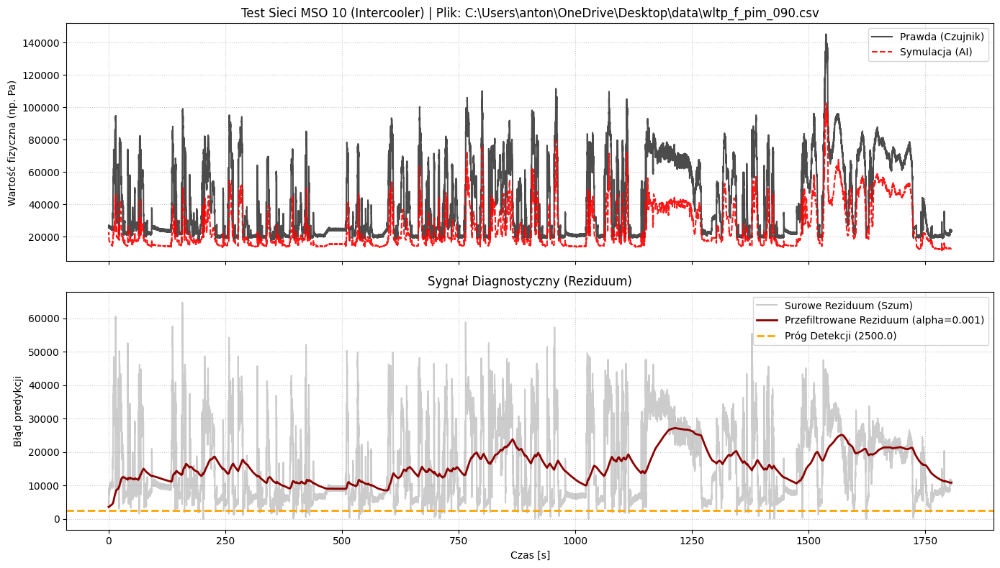

Średni błąd bezwzględny (MAE po rozgrzewce): 15901.6318
Maksymalny błąd przefiltrowany (po rozgrzewce): 27181.4629


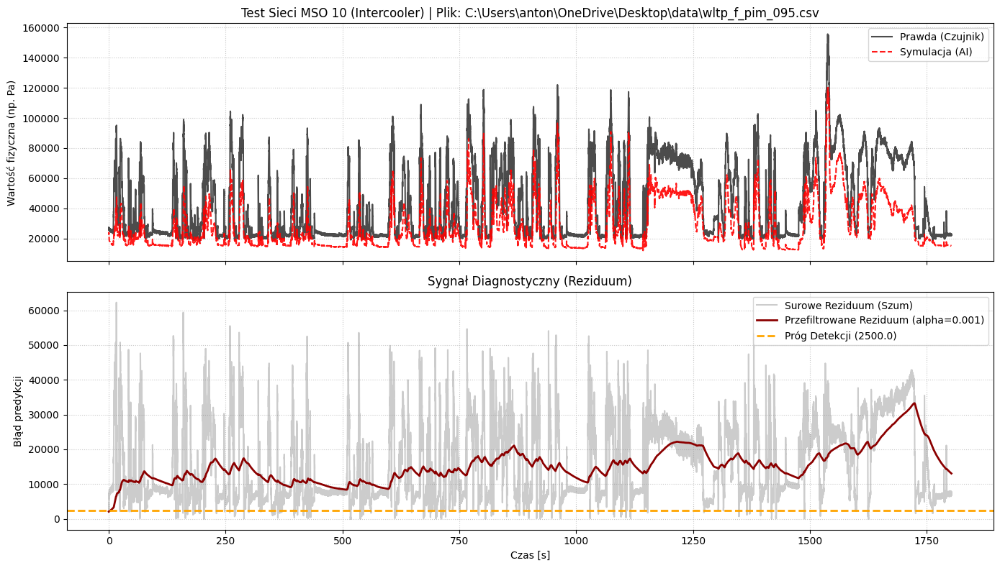

Średni błąd bezwzględny (MAE po rozgrzewce): 15588.0771
Maksymalny błąd przefiltrowany (po rozgrzewce): 33267.9805


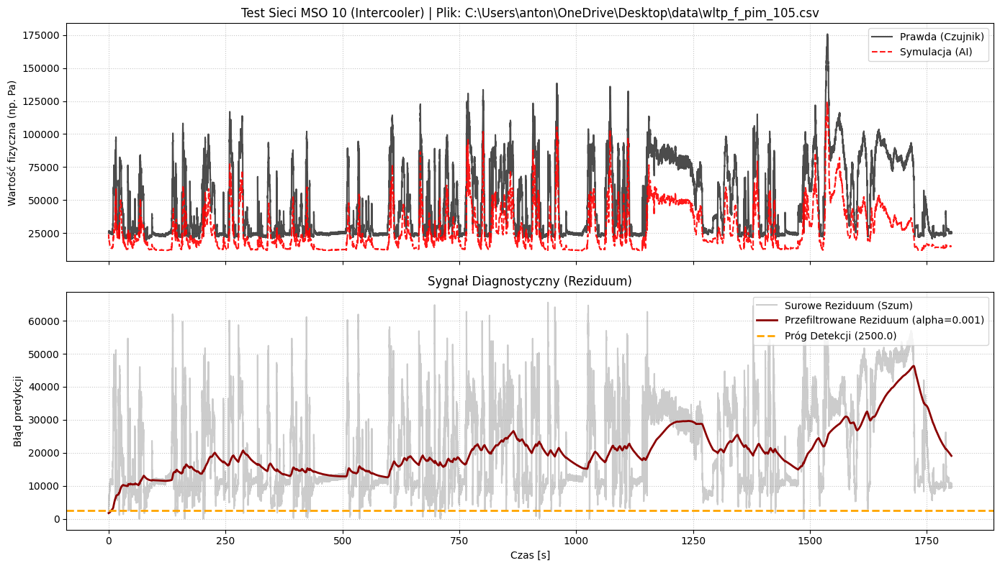

Średni błąd bezwzględny (MAE po rozgrzewce): 20858.7129
Maksymalny błąd przefiltrowany (po rozgrzewce): 46305.6680


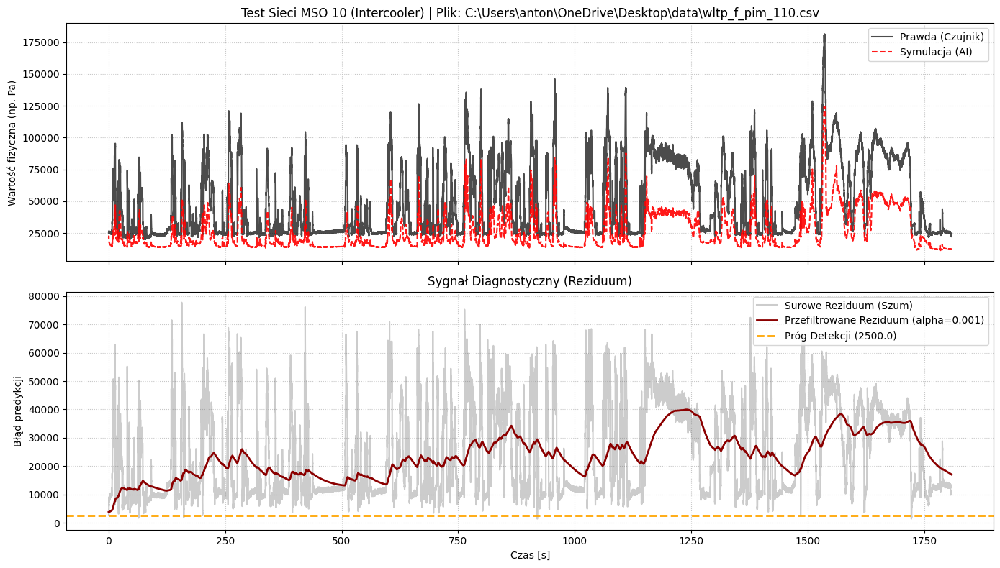

Średni błąd bezwzględny (MAE po rozgrzewce): 23834.9160
Maksymalny błąd przefiltrowany (po rozgrzewce): 39944.3516


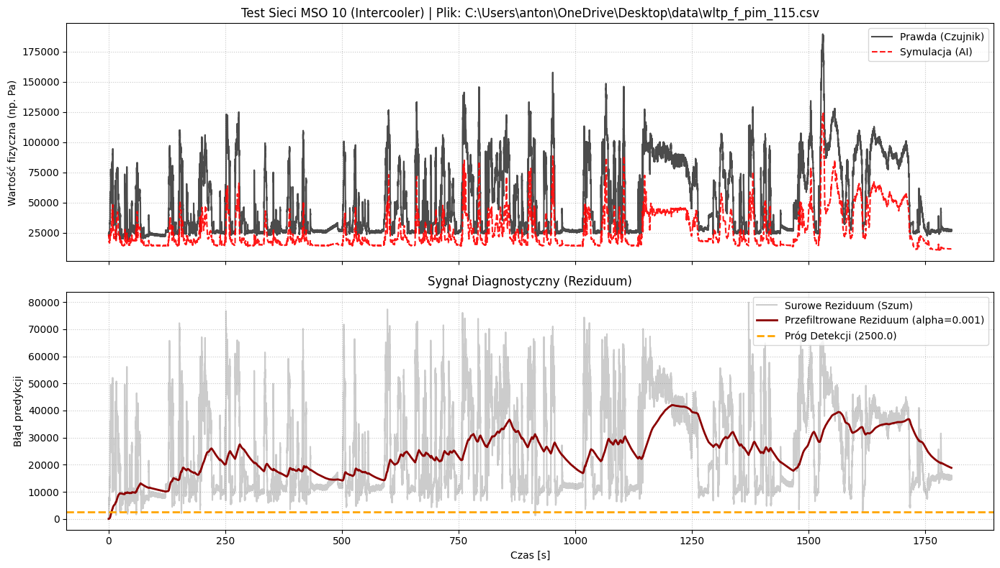

Średni błąd bezwzględny (MAE po rozgrzewce): 24995.6367
Maksymalny błąd przefiltrowany (po rozgrzewce): 42018.3906


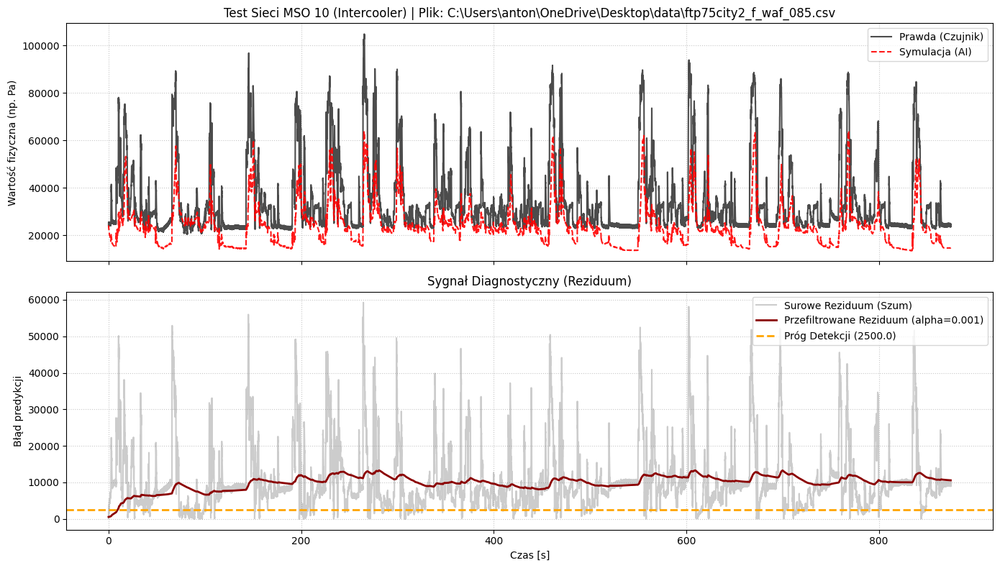

Średni błąd bezwzględny (MAE po rozgrzewce): 10556.8818
Maksymalny błąd przefiltrowany (po rozgrzewce): 13287.9609


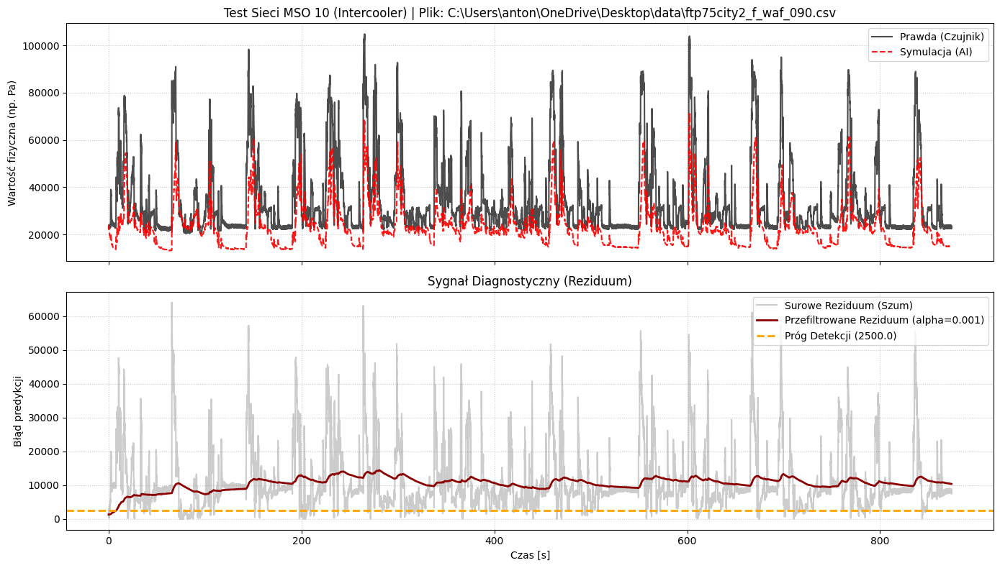

Średni błąd bezwzględny (MAE po rozgrzewce): 11044.3760
Maksymalny błąd przefiltrowany (po rozgrzewce): 14406.5518


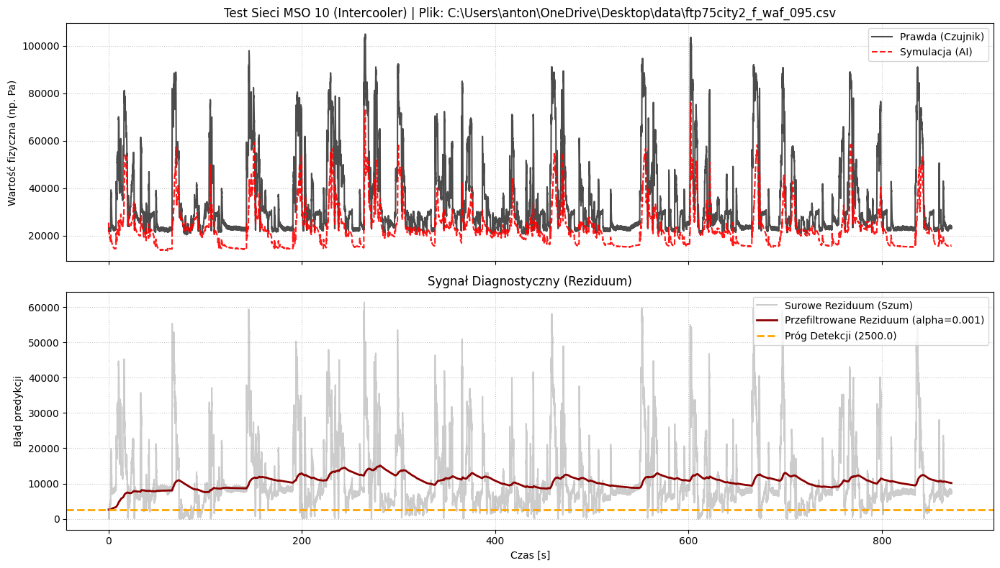

Średni błąd bezwzględny (MAE po rozgrzewce): 11037.0732
Maksymalny błąd przefiltrowany (po rozgrzewce): 15105.0098


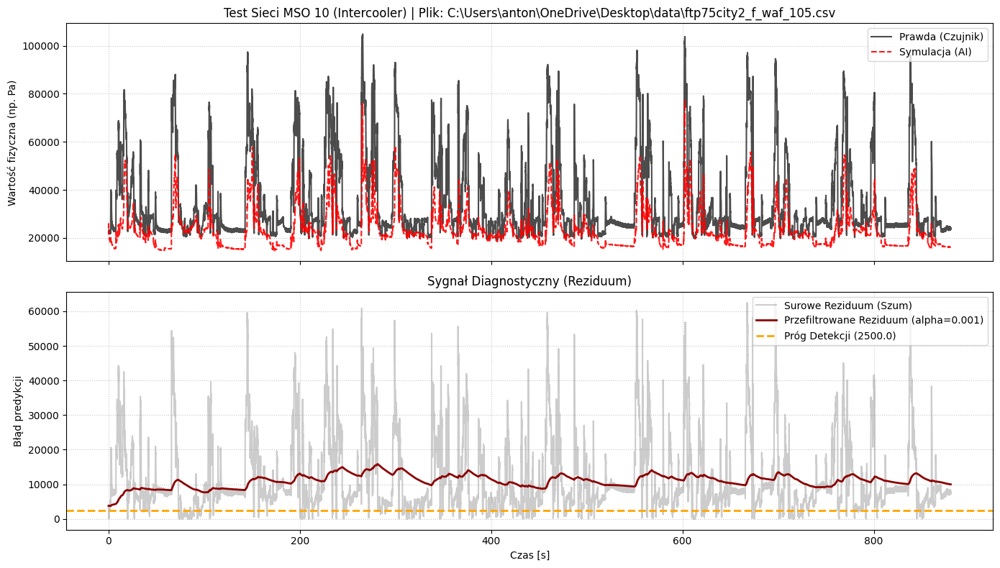

Średni błąd bezwzględny (MAE po rozgrzewce): 11385.0654
Maksymalny błąd przefiltrowany (po rozgrzewce): 15854.8291


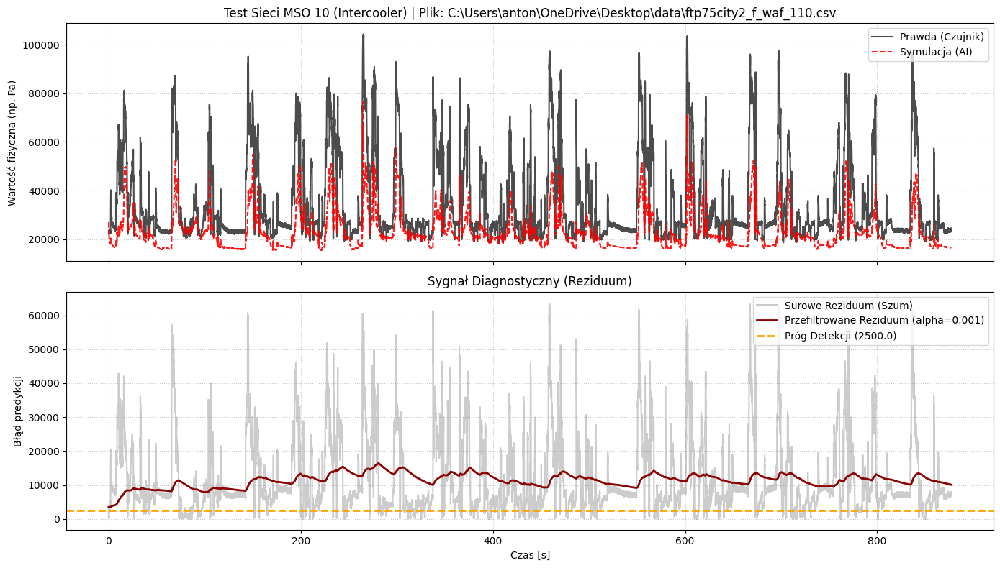

Średni błąd bezwzględny (MAE po rozgrzewce): 11775.2412
Maksymalny błąd przefiltrowany (po rozgrzewce): 16461.5840


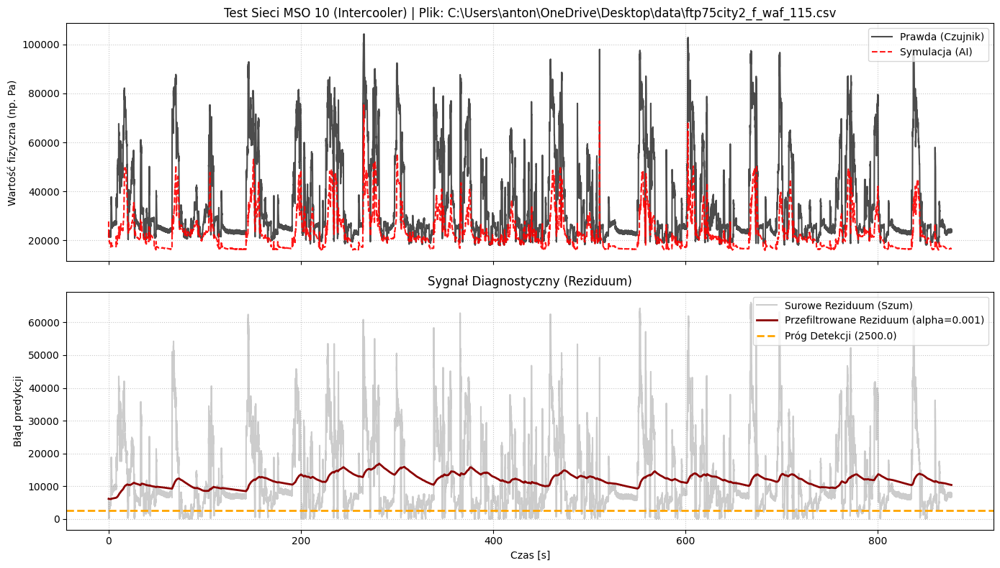

Średni błąd bezwzględny (MAE po rozgrzewce): 12132.7305
Maksymalny błąd przefiltrowany (po rozgrzewce): 16903.8359


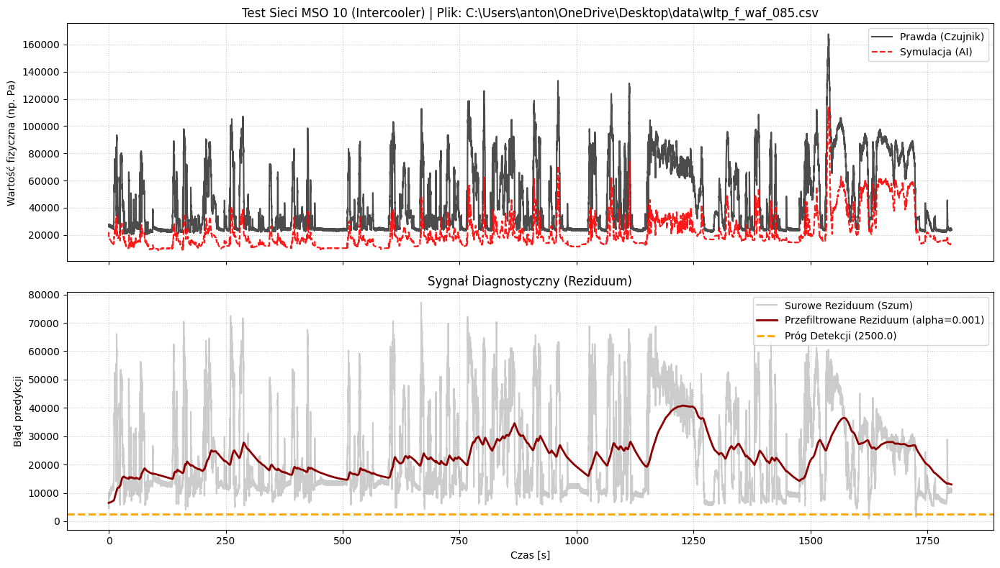

Średni błąd bezwzględny (MAE po rozgrzewce): 23050.3867
Maksymalny błąd przefiltrowany (po rozgrzewce): 40819.2266


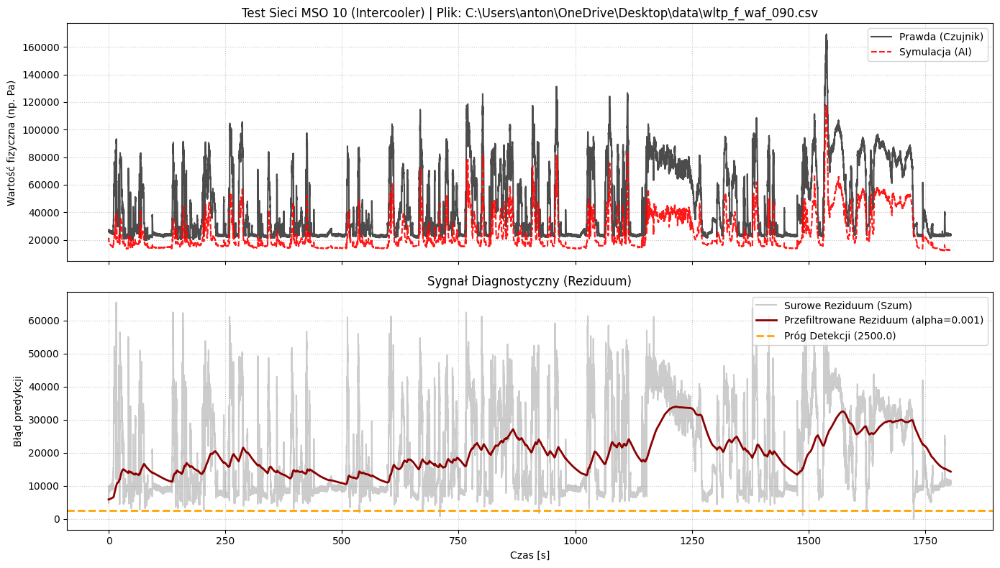

Średni błąd bezwzględny (MAE po rozgrzewce): 19754.5820
Maksymalny błąd przefiltrowany (po rozgrzewce): 33949.5078


Exception ignored in: <function WeakSet.__init__.<locals>._remove at 0x00000264F289B880>
Traceback (most recent call last):
  File "C:\Program Files\WindowsApps\PythonSoftwareFoundation.Python.3.11_3.11.2544.0_x64__qbz5n2kfra8p0\Lib\_weakrefset.py", line 40, in _remove
    self = selfref()
           ^^^^^^^^^
KeyboardInterrupt: 


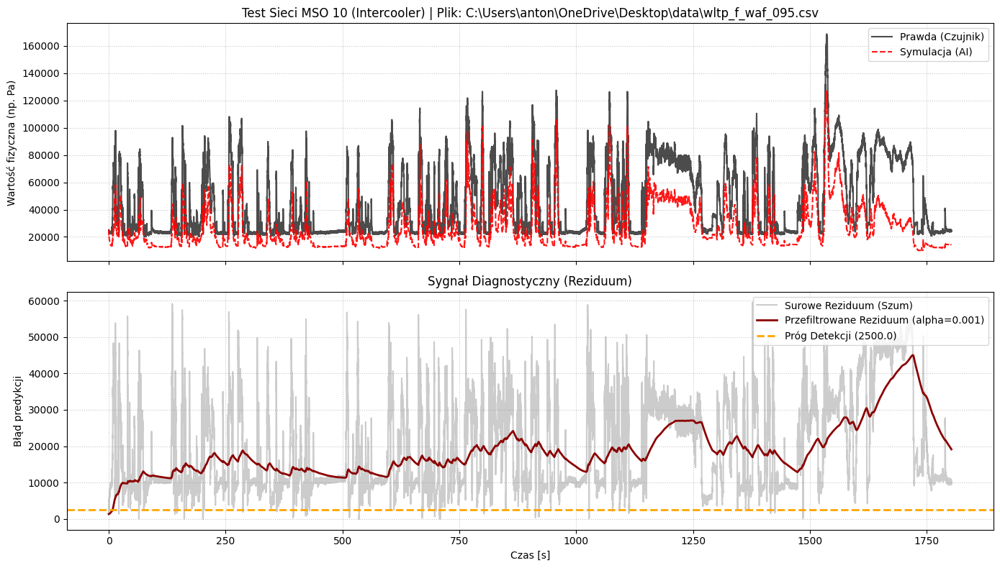

Średni błąd bezwzględny (MAE po rozgrzewce): 19203.2715
Maksymalny błąd przefiltrowany (po rozgrzewce): 45061.1016


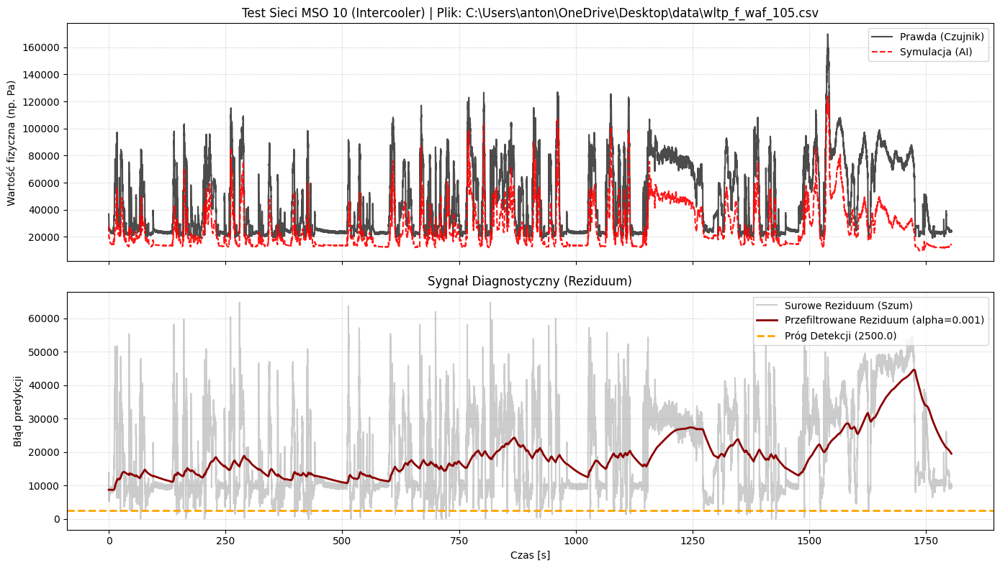

Średni błąd bezwzględny (MAE po rozgrzewce): 19192.9121
Maksymalny błąd przefiltrowany (po rozgrzewce): 44630.9414


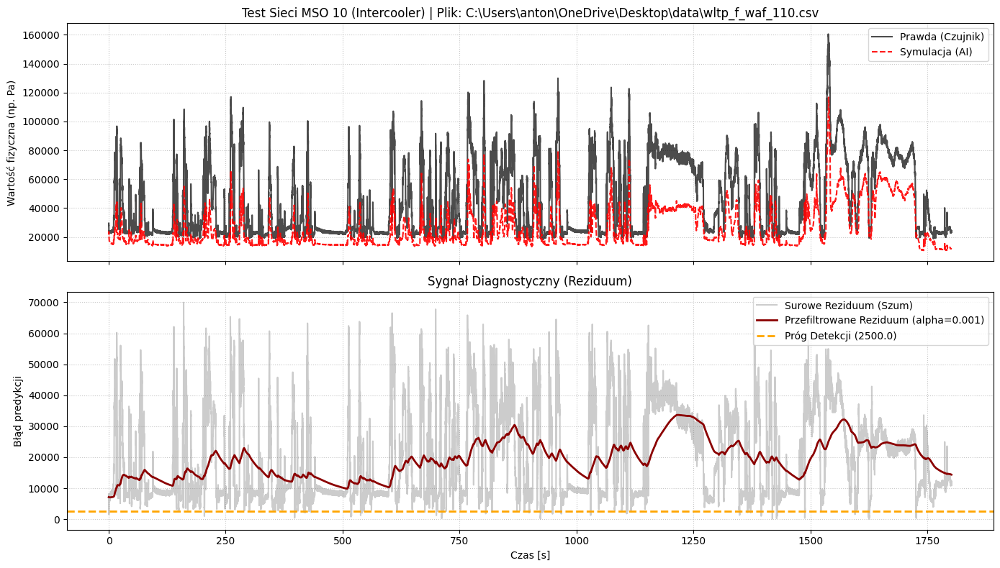

Średni błąd bezwzględny (MAE po rozgrzewce): 19597.6465
Maksymalny błąd przefiltrowany (po rozgrzewce): 33656.8750


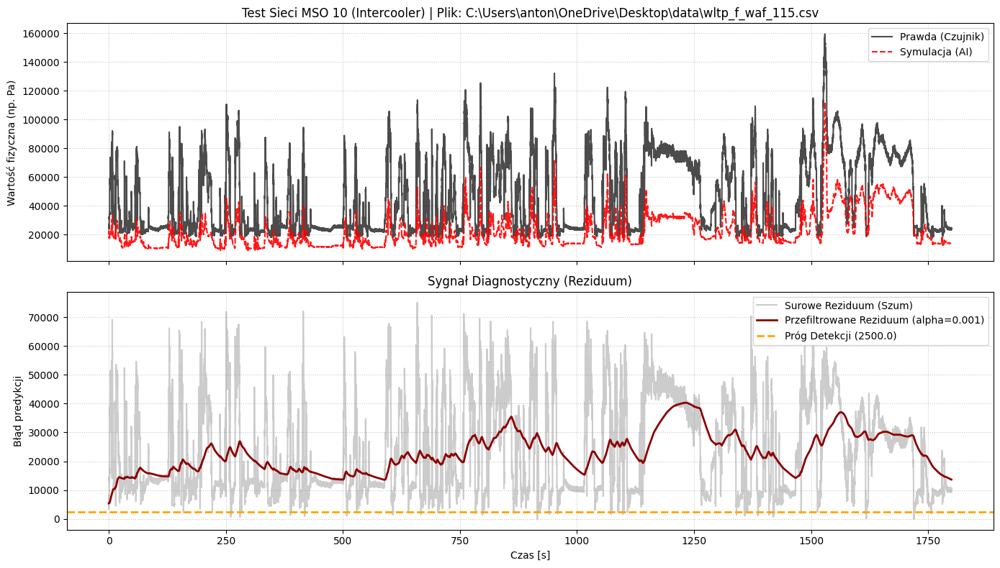

Średni błąd bezwzględny (MAE po rozgrzewce): 23097.5137
Maksymalny błąd przefiltrowany (po rozgrzewce): 40317.4180


In [9]:
model10 = GreyBoxSystem_MSO10(T_sample=0.05)

# Wczytanie wag i skalerów dla wersji z 2 stanami
model10.load_state_dict(torch.load('szara_skrzynka_mso10_wagi_inne_wyjscie.pth'))
model10.eval() # Ustawienie modelu w tryb predykcji

scaler_u10 = joblib.load('scaler_u_mso10_inne_wyjscie.pkl')
scaler_y10 = joblib.load('scaler_y_mso10_inne_wyjscie.pkl')

print("Model MSO 10 (2 stany) i skalery zostały pomyślnie wczytane z dysku!")



pliki_testowe = [FAULTY_FILES_PIC, FAULTY_FILES_PIM, FAULTY_FILES_WAF]

for pliki in pliki_testowe:
    for plik_testowy in pliki:
        validate_and_plot(model10, scaler_u10, scaler_y10, u_cols_10, y_cols_10, plik_testowy, "Test Sieci MSO 10 (Intercooler)", alpha=0.001, threshold=2500.0)

Bez detekcji

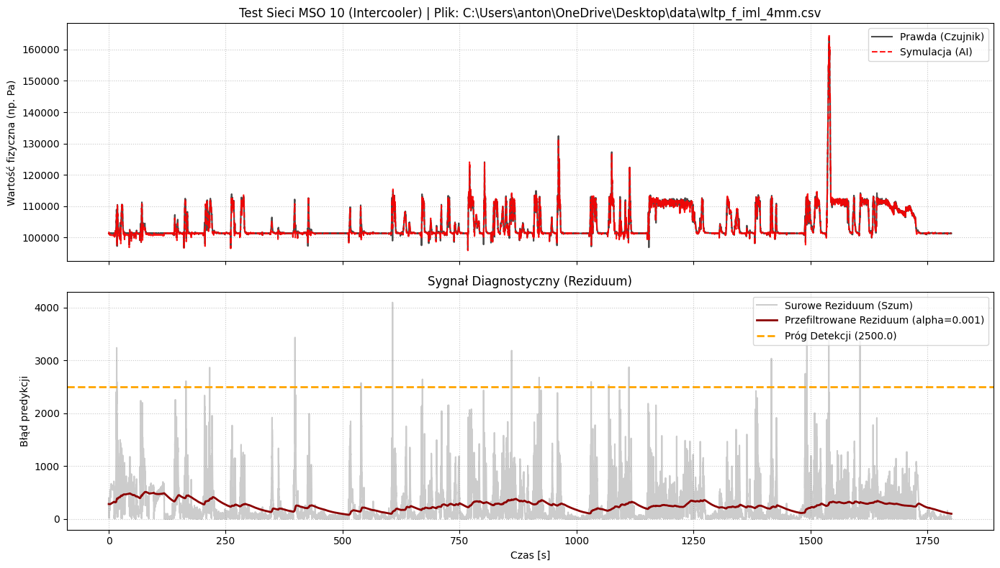

Średni błąd bezwzględny (MAE po rozgrzewce): 250.6337
Maksymalny błąd przefiltrowany (po rozgrzewce): 510.5922


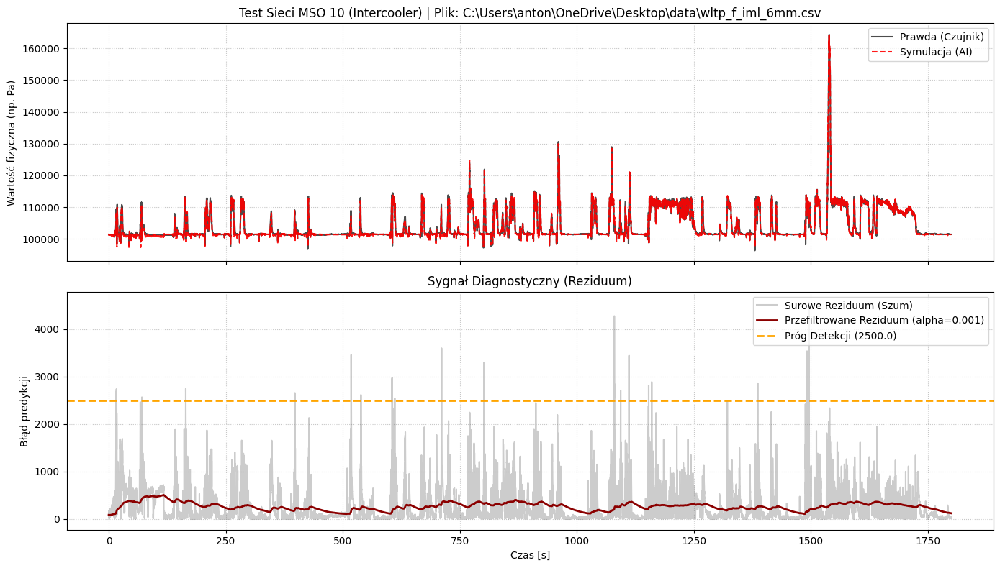

Średni błąd bezwzględny (MAE po rozgrzewce): 263.4494
Maksymalny błąd przefiltrowany (po rozgrzewce): 503.7754


In [ ]:
pliki_testowe = FAULTY_FILES_IML

for plik_testowy in pliki_testowe:
    validate_and_plot(model10, scaler_u10, scaler_y10, u_cols_10, y_cols_10, plik_testowy, "Test Sieci MSO 10 (Intercooler)", alpha=0.001, threshold=2500.0)